In [1]:
PROJECT_FOLDER = "/data/students_home/amoscatelli/Desktop/actionAnalysis/"
DATASET_FOLDER = PROJECT_FOLDER+"datasets/"
video_name_format = "S{:03d}C{:03d}P{:03d}R{:03d}A{:03d}_rgb.avi"
video_folder = "/data/datasets/NTURGBD/"

## Visualize video

In [3]:
import parse
from os.path import join, exists #, isfile, isdir
from moviepy.editor import VideoFileClip
import random

# ACTION_LABEL_SET = ["A001","A002","A007","A008","A009","A031","A049","A023"] # mine
# ACTION_LABEL_SET = ["A006","A024","A026","A027","A035"] # different from Senesi
# ACTION_LABEL_SET = ["A007","A008","A009","A023","A031"] # common with Senesi
# ACTION_LABEL_SET = ["A006","A007","A008","A009","A023","A024","A026","A027","A031","A035"] # Senesi's

###### FROM FILE NAME  #############
file_name = "S007C002P007R001A050_rgb.avi"
#              S007C002P007R001A050_rgb
# file_name = "S014C003P039R001A035_rgb.avi"
# file_name = "S011C002P015R002A006_rgb.avi"
# file_name = "S013C003P015R001A035_rgb.avi"

setup, camera, performer, replication, action = parse.parse(video_name_format,file_name)
# ####################################

# ##### FROM COORDINATES #############
# action, setup, camera, performer, replication = 31, 1, 1, 8, 1
# file_name = video_name_format.format(setup, camera, performer, replication,action)
# ###################################

# ##### FROM RANDOM COORDINATES #############
# # max(readSetups),max(readCameras),max(readPerformers),max(readReplications)

# # (17, 3, 40, 2)
# found = False
# while not found:
#     actionList = [6,7,8,9,23,24,26,27,31,35]
#     action = random.choice(actionList)
#     setup = random.randint(1,17)
#     camera = random.randint(1,3)
#     performer = random.randint(1,40)
#     replication = random.randint(1,2)
#     file_name = video_name_format.format(setup, camera, performer, replication,action)
#     filePath = join(video_folder,"nturgbd_rgb_s{:03d}".format(setup),"nturgb+d_rgb/",file_name)
#     found = exists(filePath)
        

# ###################################

# ###### FROM dataset ID #############
# import pickle

# idx = 221
# datasetName = DATASET_FOLDER+"PoseNet-101-SPLIT-dataset.pickle"
# # datasetName = DATASET_FOLDER+"keypoint_rcnn_X_101_32x8d_FPN_3x-dataset.pickle"
# with open(datasetName,'rb') as file_in:
#     trainSet,valSet,testSet = pickle.load(file_in)
#     readFeatures, readLabels, readSetups, readCameras, readPerformers, readReplications = trainSet
    
# #     readFeatures, readLabels, readSetups, readCameras, readPerformers, readReplications = pickle.load(file_in)

# setup = readSetups[idx]
# camera = readCameras[idx]
# performer = readPerformers[idx]
# replication = readReplications[idx]
# action = readLabels[idx]
# # features = readFeatures[idx]
# file_name = video_name_format.format(setup, camera, performer, replication,action)
# ####################################

print(file_name)
print()

filePath = join(video_folder,"nturgbd_rgb_s{:03d}".format(setup),"nturgb+d_rgb/",file_name)

print(filePath)

VideoFileClip(filePath).ipython_display(width=500)

S007C002P007R001A050_rgb.avi

/data/datasets/NTURGBD/nturgbd_rgb_s007/nturgb+d_rgb/S007C002P007R001A050_rgb.avi


t:   0%|          | 0/57 [00:00<?, ?it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


## Visualise keypoints on video

In [2]:
# extracting the frames of the passed video file name in tempDataVisualizerFrames/ 
import cv2
from os.path import join #, exists,isfile, isdir
def extractFrames(setup, camera, performer, replication, action, tempFrameFolder):
#     tempFrameFolder = "tempDataVisualizerFrames"
    REQUESTED_FRAMES_PER_SECONDS = 30
    
#     setup, camera, performer, replication, action = parse.parse(video_name_format, file_name)
    file_name = video_name_format.format(setup,camera,performer,replication,label)
    print(file_name)
    filePath = join(video_folder,"nturgbd_rgb_s{:03d}".format(setup),"nturgb+d_rgb",file_name)
    
    # Opens the Video file
    video = cv2.VideoCapture(filePath)

    fps = round(video.get(cv2.CAP_PROP_FPS))
    length = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
    width  = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))

    print("Original FPS: {}".format(int(fps)))
    print("Requested FPS: {}".format(int(REQUESTED_FRAMES_PER_SECONDS)))
    print("length: {} width: {} height: {}".format(length, width, height))
    frame_ratio_to_keep = max(round(fps/REQUESTED_FRAMES_PER_SECONDS),1)

    print("pick 1 frame every {}".format(int(frame_ratio_to_keep)))

    try:
        os.mkdir(tempFrameFolder)
    except:
        pass
    !rm $tempFrameFolder/* # cleaning temp
    
    i = -1
    while(video.isOpened()):
        i+=1
        ret, frame = video.read()
        if(i%frame_ratio_to_keep!=0):
            # print("DISCARDED")
            continue
        # print("PASSED")
        if ret == False:
            # print("FINISHED")
            break
        
        cv2.imwrite(tempFrameFolder+"/frame{:04d}.jpg".format(i),frame)

    video.release()
    cv2.destroyAllWindows()

## displaying Posenet

In [50]:
import pickle

# datasetName = DATASET_FOLDER+"PoseNet-101-dataset.pickle"
datasetName = DATASET_FOLDER+"PoseNet-101-TEST.pickle"
# datasetName = DATASET_FOLDER+"keypoint_rcnn_X_101_32x8d_FPN_3x-TEST.pickle"

# datasetName = DATASET_FOLDER+"keypoint_rcnn_X_101_32x8d_FPN_3x-dataset.pickle"
with open(datasetName,'rb') as file_in:
    readFeatures, readLabels, readSetups, readCameras, readPerformers, readReplications = pickle.load(file_in)

In [51]:
import numpy as np
from os import scandir # listdir
import matplotlib.pyplot as plt
from random import randrange
import pickle

plt.rcParams["figure.figsize"] = (19,15)

# ACTION_LABEL_SET = 
# A001  - A002 - A007 - A008     - A009   - A031               - A038   -  A049
# drink - eat - throw - sit down - sit up - point to something - salute - make a fun 

###### RANDOM #########
# datasetName = DATASET_FOLDER+"PoseNet-101-dataset.pickle"
# # datasetName = DATASET_FOLDER+"keypoint_rcnn_X_101_32x8d_FPN_3x-dataset.pickle"
# with open(datasetName,'rb') as file_in:
#     readFeatures, readLabels, readSetups, readCameras, readPerformers, readReplications = pickle.load(file_in)
# # label = -1
# # while(label != 9):
# idx = randrange(len(readFeatures))

###########################

###### SPECIFIED BY ID #########
# idx = 221
idx = 0
# datasetName = DATASET_FOLDER+"PoseNet-101-SPLIT-dataset.pickle"
# datasetName = DATASET_FOLDER+"keypoint_rcnn_X_101_32x8d_FPN_3x-dataset.pickle"
# with open(datasetName,'rb') as file_in:
#     trainSet,valSet,testSet = pickle.load(file_in)
#     readFeatures, readLabels, readSetups, readCameras, readPerformers, readReplications = trainSet
    
#     readFeatures, readLabels, readSetups, readCameras, readPerformers, readReplications = pickle.load(file_in)

###########################

setup = readSetups[idx]
camera = readCameras[idx]
performer = readPerformers[idx]
replication = readReplications[idx]
label = readLabels[idx]
features = readFeatures[idx]

print(idx,setup,camera,performer,replication,label)

# extracting the frames of the passed video file name in tempDataVisualizerFrames/ 
tempFrameFolder = "./tempDataVisualizerFrames/"
extractFrames(setup, camera, performer, replication, label, tempFrameFolder)
    
# folder = "./tempDataVisualizerFrames/"
framesInFolder = [f.path for f in scandir(tempFrameFolder)]
framesInFolder.sort()

for i,framePath in enumerate(framesInFolder):
    if i % 30 == 0:
        print("{}/{}".format(i,len(framesInFolder)))
    plt.axis("off")
    im = plt.imread(framePath)
    implot = plt.imshow(im)
    
    #read dataset for that picture
    if "PoseNet" in datasetName:
        x = [x[1] for x in readFeatures[idx][i]]
        y = [x[0] for x in readFeatures[idx][i]]
    else:
        x = [x[0] for x in readFeatures[idx][i]]
        y = [x[1] for x in readFeatures[idx][i]]
        
    
    categories = np.zeros(17).astype(int)
    if len(x) == 34:  
        categories = np.concatenate((categories,np.ones(17))).astype(int)

    colormap = np.array(['r', 'b'])    
    
    plt.scatter(x=x, y=y, 
                c=colormap[categories], 
                s= 40)
  
    plt.savefig(framePath, bbox_inches='tight')
    plt.close()
print("Done!")

0 7 2 7 1 50
S007C002P007R001A050_rgb.avi
Original FPS: 30
Requested FPS: 30
length: 57 width: 1920 height: 1080
pick 1 frame every 1
0/57
30/57
Done!


In [52]:
import glob
from moviepy.editor import VideoFileClip
 
img_array = []
frames = glob.glob(tempFrameFolder+"/*.jpg")
frames.sort()
for filename in frames:
    img = cv2.imread(filename)
    height, width, layers = img.shape
    size = (width,height)
    img_array.append(img)
    
tempFilePath = tempFrameFolder+"tempVideo.mp4"
    
# out = cv2.VideoWriter('project.avi',cv2.VideoWriter_fourcc(*'DIVX'), 15, size)
out = cv2.VideoWriter(tempFilePath,cv2.VideoWriter_fourcc(*'DIVX'), 15, size)
 
for i in range(len(img_array)):
    out.write(img_array[i])
out.release()


VideoFileClip(tempFilePath).ipython_display(width=500)

t:   7%|▋         | 4/57 [00:00<00:01, 36.89it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


## displaying Detectron

In [2]:
PROJECT_FOLDER = "/data/students_home/amoscatelli/Desktop/actionAnalysis/"
DATASET_FOLDER = PROJECT_FOLDER+"datasets/"
video_name_format = "S{:03d}C{:03d}P{:03d}R{:03d}A{:03d}_rgb.avi"
video_folder = "/data/datasets/NTURGBD/"

In [3]:
import pickle

# datasetName = DATASET_FOLDER+"PoseNet-101-dataset.pickle"
# datasetName = DATASET_FOLDER+"keypoint_rcnn_X_101_32x8d_FPN_3x-SPLIT-SENESI-dataset.pickle"
datasetName = DATASET_FOLDER+"keypoint_rcnn_X_101_32x8d_FPN_3x-TEST.pickle"

print("Loading", datasetName)
with open(datasetName,'rb') as file_in:
    readFeatures, readLabels, readSetups, readCameras, readPerformers, readReplications = pickle.load(file_in)
# with open(datasetName,'rb') as file_in:
#     train_set, val_set, test_set = pickle.load(file_in)    
# readFeatures, readLabels, readSetups, readCameras, readPerformers, readReplications = train_set 

Loading /data/students_home/amoscatelli/Desktop/actionAnalysis/datasets/keypoint_rcnn_X_101_32x8d_FPN_3x-SPLIT-SENESI-dataset.pickle


In [49]:
from os import scandir # listdir
import matplotlib.pyplot as plt
from random import randrange

plt.rcParams["figure.figsize"] = (19,15)

# ACTION_LABEL_SET = 
# A001  - A002 - A007 - A008     - A009   - A031               - A038   -  A049
# drink - eat - throw - sit down - sit up - point to something - salute - make a fun 

#### RANDOM VIDEO #####
# idx = randrange(len(readFeatures))
idx = 0
setup = readSetups[idx]
camera = readCameras[idx]
performer = readPerformers[idx]
replication = readReplications[idx]
label = readLabels[idx]
features = readFeatures[idx]
#########



print("idx {}, setup {}, camera {}, performer {}, replication {}, label {}".format(idx,setup,camera,performer,replication,label))


# extracting the frames of the passed video file name in tempDataVisualizerFrames/ 
tempFrameFolder = "./tempDataVisualizerFrames/"
extractFrames(setup, camera, performer, replication, label, tempFrameFolder)
    
# folder = "./tempDataVisualizerFrames/"
framesInFolder = [f.path for f in scandir(tempFrameFolder)]
framesInFolder.sort()


# extracting the frames of the passed video file name in tempDataVisualizerFrames/ 
print("Extracting frames...")
tempFrameFolder = "./tempDataVisualizerFrames/"
extractFrames(setup, camera, performer, replication, label, tempFrameFolder)
    
framesInFolder = [f.path for f in scandir(tempFrameFolder)]
framesInFolder.sort()

for i,framePath in enumerate(framesInFolder):
    if i % 30 == 0:
        print("{}/{}".format(i,len(framesInFolder)))
    plt.axis("off")
    im = plt.imread(framePath)
    implot = plt.imshow(im)
    
    #read dataset for that picture
    if "PoseNet" in datasetName:
        x = [x[1] for x in readFeatures[idx][i]]
        y = [x[0] for x in readFeatures[idx][i]]
    else:
        x = [x[0] for x in readFeatures[idx][i]]
        y = [x[1] for x in readFeatures[idx][i]]
        
    categories = np.zeros(17).astype(int)
    if len(x) == 34:  
        categories = np.concatenate((categories,np.ones(17))).astype(int)

    colormap = np.array(['r', 'b'])    
    
    plt.scatter(x=x, y=y, 
                c=colormap[categories], 
                s= 40)
  
    plt.savefig(framePath, bbox_inches='tight')
    plt.close()
print("Done!")


import glob
from moviepy.editor import VideoFileClip
 
img_array = []
frames = glob.glob(tempFrameFolder+"/*.jpg")
frames.sort()
for filename in frames:
    img = cv2.imread(filename)
    height, width, layers = img.shape
    size = (width,height)
    img_array.append(img)
    
tempFilePath = tempFrameFolder+"tempVideo.mp4"
    
# out = cv2.VideoWriter('project.avi',cv2.VideoWriter_fourcc(*'DIVX'), 15, size)
out = cv2.VideoWriter(tempFilePath,cv2.VideoWriter_fourcc(*'DIVX'), 15, size)
 
for i in range(len(img_array)):
    out.write(img_array[i])
out.release()


VideoFileClip(tempFilePath).ipython_display(width=500)

idx 0, setup 7, camera 2, performer 7, replication 1, label 50
S007C002P007R001A050_rgb.avi
Original FPS: 30
Requested FPS: 30
length: 57 width: 1920 height: 1080
pick 1 frame every 1
Extracting frames...
S007C002P007R001A050_rgb.avi
Original FPS: 30
Requested FPS: 30
length: 57 width: 1920 height: 1080
pick 1 frame every 1
0/57
30/57
Done!


t:   5%|▌         | 3/57 [00:00<00:01, 29.93it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


# dataset overview

In [10]:
def getZeroStatsForDataset(X):
    totalsize = sum([len(x)*34 for x in X])
    non_zero_elements = sum([np.count_nonzero(x) for x in X])
    zero_elements = totalsize - non_zero_elements
    return totalsize, zero_elements

In [117]:
def getFirstZeroCoordinate(X):
    for video_idx, video in enumerate(X):
        if np.count_nonzero(video) < len(video)*34:
            for frame_idx, frame in enumerate(video):
                if np.count_nonzero(frame)< 34:
                    return video_idx,frame_idx

In [130]:
getFirstZeroCoordinate(allFeatures)
# len(allFeatures[0]*34),np.count_nonzero(allFeatures[0])
allFeatures[29][35][3] == [0.0,0.0]

True

In [11]:
import numpy as np
# readFeatures, readLabels, readSetups, readCameras, readPerformers, readReplications 
lenght = sum([len(x)*17 for x in readFeatures])
totalsize, zero_elements = getZeroStatsForDataset(readFeatures)
print("number of zeros: {} ({:.3f}%)".format(zero_elements,zero_elements/totalsize*100))

number of zeros: 15266 (0.095%)


In [12]:
numberOfZeros = 0
for features in readFeatures:
    for frameFeatures in features:
        for point in frameFeatures:
            if point[0]==0 or point[1]==0:
                    numberOfZeros +=1
print(numberOfZeros)

7633


## diplay jumps of keypoints along videos

In [12]:
PROJECT_FOLDER = "/data/students_home/amoscatelli/Desktop/actionAnalysis/"
DATASET_FOLDER = PROJECT_FOLDER+"datasets/"

In [2]:
import numpy as np
def getJumps(X): #splitting jumps by x,y and considering also [0,0] points
    print("getting jumps of dataset")
    newX = []
    for frames in X:
        jumps = []
        for i in range(len(frames)-1):
            jumps.append(np.array(frames[i+1])-np.array(frames[i]))
        newX.append(jumps)
    return np.array(newX)

In [13]:
import numpy as np
from scipy.spatial import distance

def getEuclideanJumps(X):#get cartesian jumps avoiding jumps from/to [0,0] points
    print("getting EUCLIDEAN jumps of dataset")
    jumps = [[] for i in range(len(X[0][0]))]
    for frames_idx, frames in enumerate(X):
        if frames_idx % 500 == 0:
            print("{}/{}".format(frames_idx,len(X)))
        for keypoint_idx in range(len(frames[0])):
            kypoint_jumps = [distance.euclidean( frames[i][keypoint_idx], frames[i+1][keypoint_idx] ) 
                             for i in range(len(frames)-1)
#                              if frames[i][keypoint_idx] != [0.0, 0.0]
#                              and frames[i+1][keypoint_idx] != [0.0, 0.0]
                            ]
            jumps[keypoint_idx] = np.concatenate((jumps[keypoint_idx],kypoint_jumps))
    return np.array(jumps)

In [9]:
test_X = [
    [#video 1
        [#frame 1
            [1,1],[2,2],[3,3]
        ],
        [#frame 2
            [2,2],[3,3],[5,5]
        ],
        [#frame 3
            [3,3],[5,5],[8,8]
        ]
    ],
    [#video 2
        [#frame 1
            [11,11],[22,22],[33,33]
        ],
        [#frame 2
            [22,22],[0,0],[55,55]
        ],
        [#frame 3
            [33,33],[55,55],[88,88]
        ],
        [#frame 4
            [55,55],[88,88],[90,90]
        ]
    ]
]

In [10]:
getEuclideanJumps(test_X)

getting EUCLIDEAN jumps of dataset
0/2


array([[ 1.41421356,  1.41421356, 15.55634919, 15.55634919, 31.11269837],
       [ 1.41421356,  2.82842712, 31.11269837, 77.78174593, 46.66904756],
       [ 2.82842712,  4.24264069, 31.11269837, 46.66904756,  2.82842712]])

In [14]:
import pickle

# datasetName = DATASET_FOLDER+"PoseNet-101-dataset.pickle"
datasetName = DATASET_FOLDER+"keypoint_rcnn_X_101_32x8d_FPN_3x-SPLIT-SENESI-dataset.pickle"

print("Loading", datasetName)
# with open(datasetName,'rb') as file_in:
#     readFeatures, readLabels, readSetups, readCameras, readPerformers, readReplications = pickle.load(file_in)
with open(datasetName,'rb') as file_in:
    train_set, val_set, test_set = pickle.load(file_in)

Loading /data/students_home/amoscatelli/Desktop/actionAnalysis/datasets/keypoint_rcnn_X_101_32x8d_FPN_3x-SPLIT-SENESI-dataset.pickle


In [15]:
allFeatures = np.concatenate((train_set[0],val_set[0],test_set[0]),axis=0)

In [ ]:
# jumpx_x = getJumps(allFeatures)
# allFrameList = np.concatenate(jumpx_x,axis=0)
# allPointList = np.concatenate(allFrameList,axis=1)

In [16]:
jumps = getEuclideanJumps(allFeatures)

getting EUCLIDEAN jumps of dataset
0/9480
500/9480
1000/9480
1500/9480
2000/9480
2500/9480
3000/9480
3500/9480
4000/9480
4500/9480
5000/9480
5500/9480
6000/9480
6500/9480
7000/9480
7500/9480
8000/9480
8500/9480
9000/9480


In [ ]:
import matplotlib.pyplot as plt

legend = ["nose", "leftEye", "rightEye", "leftEar", "rightEar",
          "leftShoulder", "rightShoulder", "leftElbow", "rightElbow", "leftWrist", "rightWrist",
          "leftHip", "rightHip", "leftKnee", "rightKnee", "leftAnkle", "rightAnkle"]
n_bins = 100
rows = 6
fig, axes = plt.subplots(nrows=rows, ncols=3)
axes = np.concatenate(axes)
fig.set_size_inches(15,5*rows)
print("Plotting results...")
for keypoint_idx, keypointJumps in enumerate(jumps):
    ax = axes[keypoint_idx]
    ax.hist(keypointJumps, n_bins
#             , density=True
            , histtype='bar'
            ,log=True )
    ax.set_title(legend[keypoint_idx])

allJumps = np.concatenate(jumps)
ax = axes[keypoint_idx+1]
ax.hist(allJumps, n_bins
#         , density=True
        , histtype='bar'
        ,log=True)
ax.set_title("GLOBAL")
fig.tight_layout()
plt.show()

Plotting results...


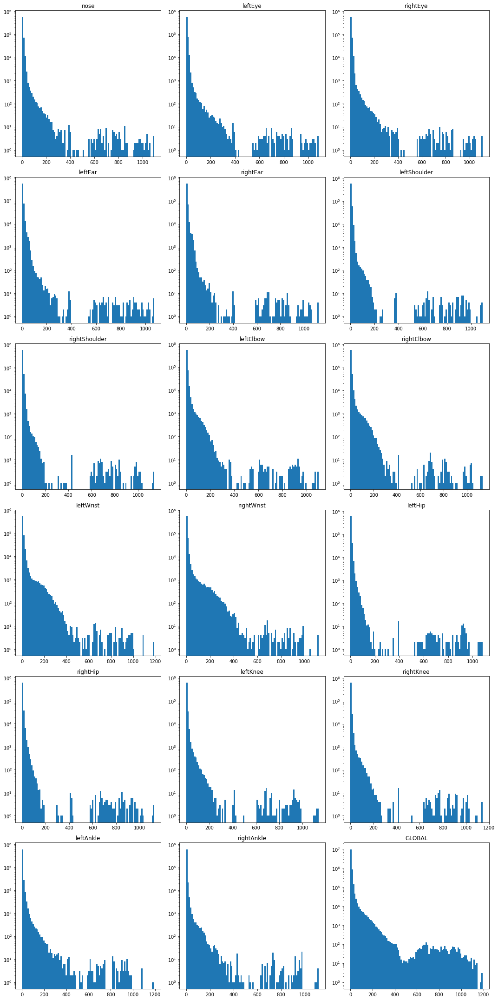

In [84]:
# AVOIDING [0,0] POINTS
import matplotlib.pyplot as plt

legend = ["nose", "leftEye", "rightEye", "leftEar", "rightEar",
          "leftShoulder", "rightShoulder", "leftElbow", "rightElbow", "leftWrist", "rightWrist",
          "leftHip", "rightHip", "leftKnee", "rightKnee", "leftAnkle", "rightAnkle"]
n_bins = 100
rows = 6
fig, axes = plt.subplots(nrows=rows, ncols=3)
axes = np.concatenate(axes)
fig.set_size_inches(15,5*rows)
print("Plotting results...")
for keypoint_idx, keypointJumps in enumerate(jumps):
    ax = axes[keypoint_idx]
    ax.hist(keypointJumps, n_bins
#             , density=True
            , histtype='bar'
            ,log=True )
    ax.set_title(legend[keypoint_idx])

allJumps = np.concatenate(jumps)
ax = axes[keypoint_idx+1]
ax.hist(allJumps, n_bins
#         , density=True
        , histtype='bar'
        ,log=True)
ax.set_title("GLOBAL")
fig.tight_layout()
plt.show()
# AVOIDING [0,0] POINTS

Plotting results...


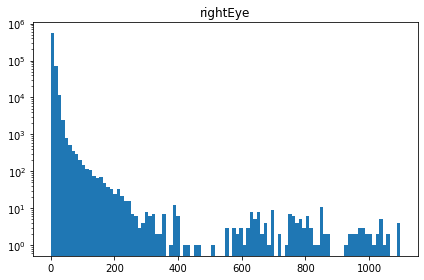

In [83]:
import matplotlib.pyplot as plt

legend = ["nose", "leftEye", "rightEye", "leftEar", "rightEar",
          "leftShoulder", "rightShoulder", "leftElbow", "rightElbow", "leftWrist", "rightWrist",
          "leftHip", "rightHip", "leftKnee", "rightKnee", "leftAnkle", "rightAnkle"]
n_bins = 100
rows = 1
fig, axes = plt.subplots(nrows=rows, ncols=1)
# axes = np.concatenate(axes)
# fig.set_size_inches(15,5*rows)
print("Plotting results...")
# for keypoint_idx, keypointJumps in enumerate(jumpx_x[:1]):
ax = axes
ax.hist(jumps[0], n_bins
#         , density=True
        , histtype='bar'
        ,log=True
       )
ax.set_title(legend[keypoint_idx])

# allJumps = np.concatenate(jumpx_x)
# ax = axes[keypoint_idx+1]
# ax.hist(allJumps, n_bins, density=True, histtype='bar',log=True)
# ax.set_title("GLOBAL")
fig.tight_layout()
plt.show()

# AREA TEST

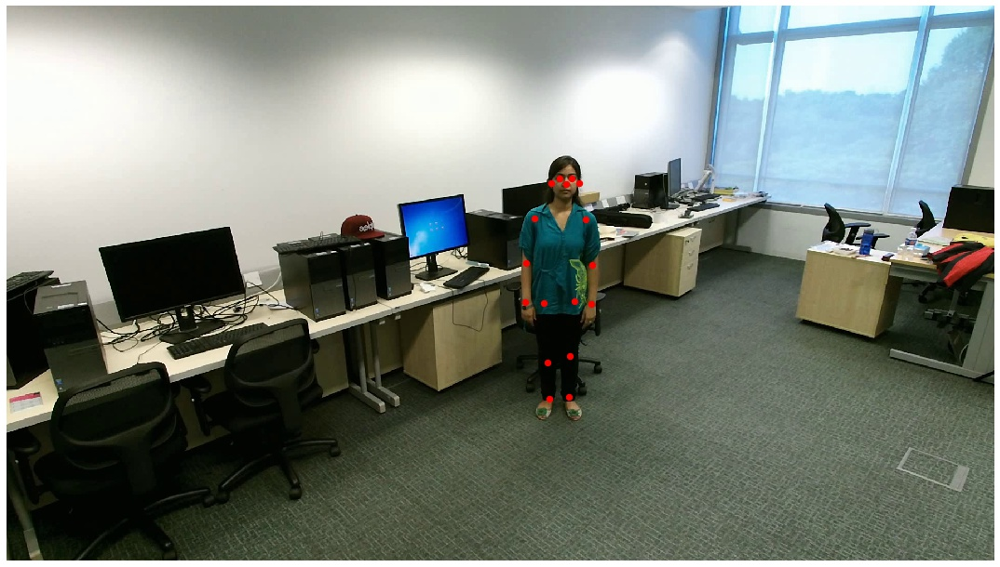

In [53]:
from IPython.display import Image
Image(framePath)

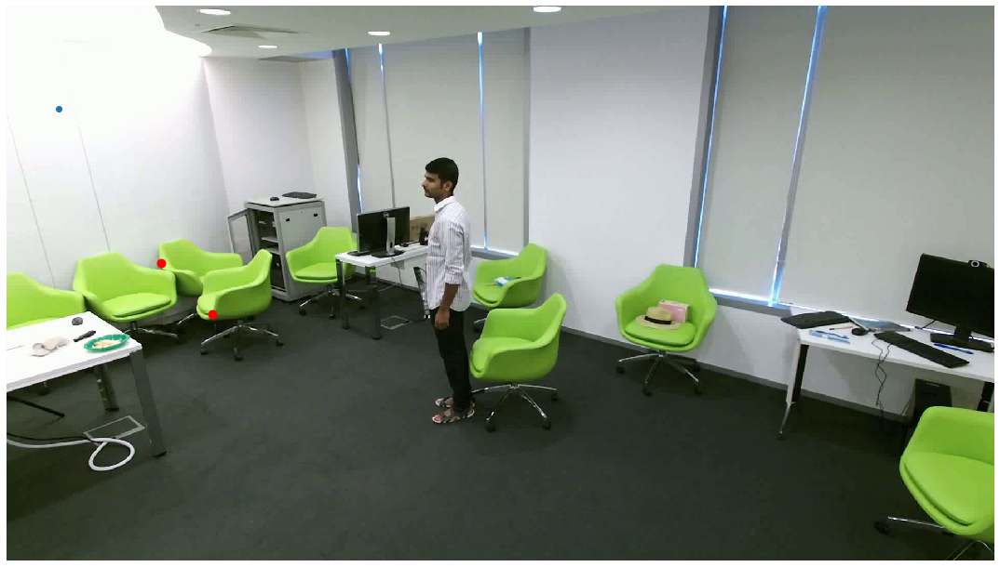

In [99]:
import matplotlib.pyplot as plt
# from matplotlib.pyplot import figure
# figure(num=None, figsize=(1080, 1920), dpi=80, facecolor='w', edgecolor='k')

plt.rcParams["figure.figsize"] = (19,15)
image_name = "temp/frame0000.jpg"
im = plt.imread(image_name)
implot = plt.imshow(im)

# put a blue dot at (10, 20)
plt.scatter([100], [200])

# put a red dot, size 40, at 2 locations:
plt.scatter(x=[300, 400], y=[500, 600], c='r', s= 80)
plt.axis("off")
plt.savefig('temp.jpg')
plt.show()

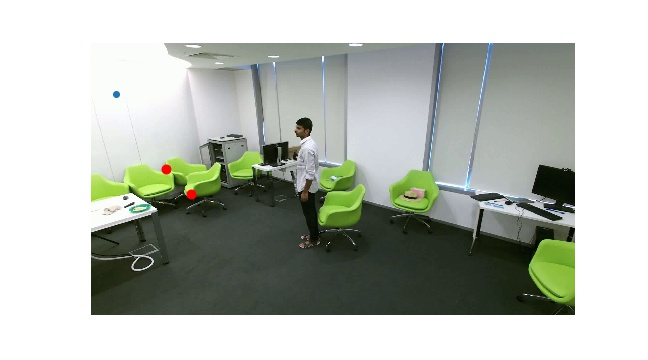

In [64]:
from IPython.display import Image
Image("temp.jpg")
# image_name = "temp.jpg"
# im = plt.imread(image_name)
# implot = plt.imshow(im)
# # figure(num=None, figsize=(10, 6), dpi=80, facecolor='w', edgecolor='k')

# # # put a blue dot at (10, 20)
# # plt.scatter([100], [200])

# # # put a red dot, size 40, at 2 locations:
# # plt.scatter(x=[300, 400], y=[500, 600], c='r', s= 80)
# # # plt.savefig('temp.png')
# # plt.savefig('temp.jpg')
# plt.axis("off")
# plt.show()

In [71]:
import cv2
import numpy as np
import glob
 
img_array = []
frames = glob.glob('temp/*.jpg')
frames.sort()
for filename in frames:
    img = cv2.imread(filename)
    height, width, layers = img.shape
    size = (width,height)
    img_array.append(img)
 
 
# out = cv2.VideoWriter('project.avi',cv2.VideoWriter_fourcc(*'DIVX'), 15, size)
out = cv2.VideoWriter('project.mp4',cv2.VideoWriter_fourcc(*'DIVX'), 15, size)
 
for i in range(len(img_array)):
    out.write(img_array[i])
out.release()

In [72]:
from IPython.display import HTML
from base64 import b64encode
filePath = "project.mp4"

print(filePath)
from moviepy.editor import VideoFileClip

VideoFileClip(filePath).ipython_display(width=500)

project.mp4


t:   5%|▌         | 3/60 [00:00<00:01, 28.87it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [66]:
!ls temp

frame0000.jpg  frame0012.jpg  frame0024.jpg  frame0036.jpg  frame0048.jpg
frame0001.jpg  frame0013.jpg  frame0025.jpg  frame0037.jpg  frame0049.jpg
frame0002.jpg  frame0014.jpg  frame0026.jpg  frame0038.jpg  frame0050.jpg
frame0003.jpg  frame0015.jpg  frame0027.jpg  frame0039.jpg  frame0051.jpg
frame0004.jpg  frame0016.jpg  frame0028.jpg  frame0040.jpg  frame0052.jpg
frame0005.jpg  frame0017.jpg  frame0029.jpg  frame0041.jpg  frame0053.jpg
frame0006.jpg  frame0018.jpg  frame0030.jpg  frame0042.jpg  frame0054.jpg
frame0007.jpg  frame0019.jpg  frame0031.jpg  frame0043.jpg  frame0055.jpg
frame0008.jpg  frame0020.jpg  frame0032.jpg  frame0044.jpg  frame0056.jpg
frame0009.jpg  frame0021.jpg  frame0033.jpg  frame0045.jpg  frame0057.jpg
frame0010.jpg  frame0022.jpg  frame0034.jpg  frame0046.jpg  frame0058.jpg
frame0011.jpg  frame0023.jpg  frame0035.jpg  frame0047.jpg  frame0059.jpg


In [2]:
# import os
# from os import listdir, scandir
# from os.path import isfile, isdir, join #, exists
# import pickle
# import numpy as np
# import parse
# video_folder_format = "S{:3d}C{:3d}P{:3d}R{:3d}A{:3d}_rgb"

In [3]:
import os
os.environ['PATH'] = "/sbin:/bin:/usr/bin:/usr/local/bin:/snap/bin:/usr/lib/jvm/java-8-oracle/bin:/usr/lib/jvm/java-8-oracle/db/bin:/usr/lib/jvm/java-8-oracle/jre/bin:/usr/lib/jvm/java-8-oracle/bin:/usr/lib/jvm/java-8-oracle/db/bin:/usr/lib/jvm/java-8-oracle/jre/bin"
os.environ['PATH'] = PROJECT_FOLDER+"/miniconda3/bin:" + os.environ['PATH']

In [ ]:
!conda install parse

Solving environment: failed with initial frozen solve. Retrying with flexible solve.

In [4]:
!pip3 install parse

In [1]:
# from IPython.display import HTML
# from base64 import b64encode
import parse
# import os
# from os import listdir
from os.path import join #, isfile, isdir


# ACTION_LABEL_SET = ["A001","A002","A007","A008","A009","A031","A038","A049"]
# drink - eat - throw - sit down - sit up - point to something - salute - make a fun 
# file_name = "S001C001P001R001A046_rgb.avi"
file_name = "S009C003P007R002A002_rgb.avi"
print(file_name)
video_name_format = "S{:3d}C{:3d}P{:3d}R{:3d}A{:3d}_rgb.avi"
dataset_folder = "/data/datasets/NTURGBD"

setup, camera, performer, replication, action = parse.parse(video_name_format,file_name)

filePath = join(dataset_folder,"nturgbd_rgb_s{:03d}".format(setup),"nturgb+d_rgb/",file_name)

print(filePath)
from moviepy.editor import VideoFileClip

VideoFileClip(filePath).ipython_display(width=500)

S009C003P007R002A002_rgb.avi
/data/datasets/NTURGBD/nturgbd_rgb_s009/nturgb+d_rgb/S009C003P007R002A002_rgb.avi
pygame 1.9.6
Hello from the pygame community. https://www.pygame.org/contribute.html


t:   1%|▏         | 3/225 [00:00<00:08, 26.03it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [4]:
from os import listdir
from os.path import isfile, isdir, join, exists

folder = "../inputData/"
filesInFolder = [f for f in listdir(folder) if isdir(join(folder, f))]


In [6]:
len(filesInFolder)

912

In [14]:
folder = "../inputData/"
len([f for f in listdir(folder) if isdir(join(folder, f))])


925